# Week 3 Assignment Census Data
## Transportation profile Los Angeles
### Commuting times by neighborhoods 


### The following assignment looks to examine, visualize and represent the data collected from the percentages of workers that commute
### longer than 1 hour to their workplace around different neighborhoods in the LA County. This data is a first step to provide results from the places and amount of people that spend significant time getting to their workplace, understanding the complexity and future problems this situation brings to the wellbeing of citizens and their quality of life


### Jose Portales

In [573]:
# First, provide workstation. import pandas to provide library for data exploration
# provide entrance for downloaded data

In [574]:
import pandas as pd
import geopandas as gpd
neighborhoods=gpd.read_file('incneigh.geojson')

In [575]:
#First we want to upload the csv files and filter the needed data
# The first csv is from the neighborhoods in LA County. The only file founded for this specifial spatial unit was one from the  Incarceration Impact by neighborhood. It was then renamed and uploaded

In [576]:
#Check the size of the data
neighborhoods.shape

(244, 20)

In [577]:
#Check a small sample of the columns and rows
neighborhoods.head()

,OBJECTID,Neighborhood,LAPD_Cost,LAPD_Days_in_Jail,LAPD_Arrests,LASD_Cost,LASD_Days_in_Jail,LASD_Arrests,F2010_Population,Combo_Cost,Combo_Cost_PerPop,Combo_Days,Combo_Days_PerPop,Combo_Arrests,Combo_Arrests_PerPop,spa,sup_dist,SHAPE_Length,SHAPE_Area,geometry
0,1,Acton,25282,110,51,1103120,7367,396,6128,1128402,184.138708,7477,1.220137,447,0.072944,SPA 1 - Antelope Valley,District 5,0.554615,0.010002,"MULTIPOLYGON Z (((-118.20262 34.53899 0.00000,..."
1,2,Agoura Hills,83892,365,216,587038,3288,470,17147,670930,39.128127,3653,0.213040,686,0.040007,SPA 2 - San Fernando,District 3,0.255669,0.002063,"MULTIPOLYGON Z (((-118.76193 34.16820 0.00000,..."
2,3,Agua Dulce,10573,46,23,377880,2513,140,21499,388453,18.068422,2559,0.119029,163,0.007582,SPA 1 - Antelope Valley,District 5,0.439983,0.008000,"MULTIPOLYGON Z (((-118.25468 34.55830 0.00000,..."
3,4,Alhambra,301550,1312,647,2444920,16637,751,3535,2746470,776.936351,17949,5.077511,1398,0.395474,SPA 3 - San Gabriel,District 1,0.210733,0.001929,"MULTIPOLYGON Z (((-118.12175 34.10504 0.00000,..."
4,5,Alondra Park,55621,242,112,667093,4244,326,83089,722714,8.698071,4486,0.053990,438,0.005271,SPA 8 - South Bay,District 2,0.078123,0.000288,"MULTIPOLYGON Z (((-118.32651 33.89757 0.00000,..."


<Axes: >

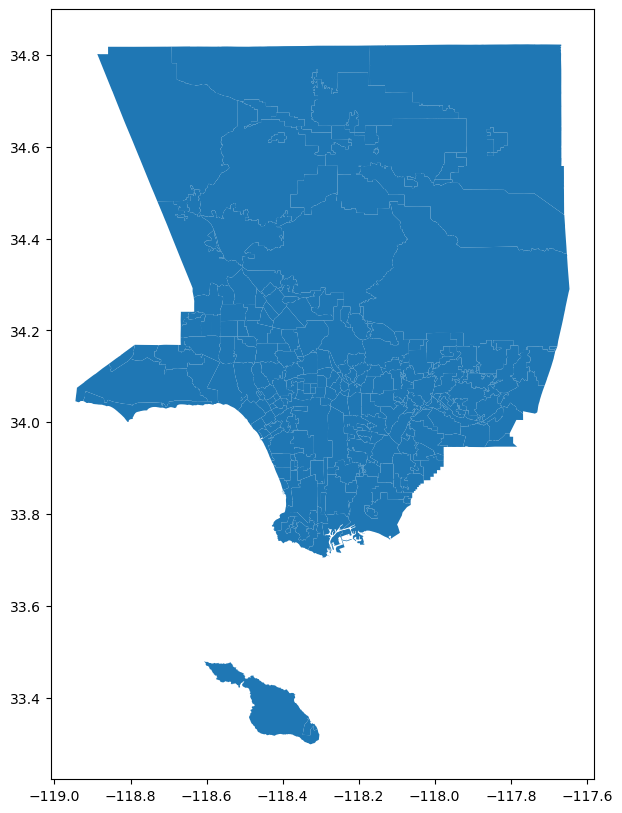

In [578]:
#Plot the file to undestrand the size of the "geometry" of the geojsn file
neighborhoods.plot(figsize=(12,10))

In [579]:
#shorten the data and generate a new dataframe with the deisred information.We only need specific variables and info

columns_to_keep = ['OBJECTID',
                   'spa',
                   'Neighborhood',
                   'sup_dist',
                  'geometry']

In [580]:
neighborhoods2 = neighborhoods[columns_to_keep]

In [581]:
#Check the size of the new, trimmed variable
neighborhoods2.shape

(244, 5)

In [582]:
#Create another variable trimming another information, this time 2 rows that contain information about the unwanted neighborhoods(islands below)

neighborhoods3 = neighborhoods2.drop([11, 207])

In [583]:
#Check the new variable
neighborhoods3.shape

(242, 5)

<Axes: >

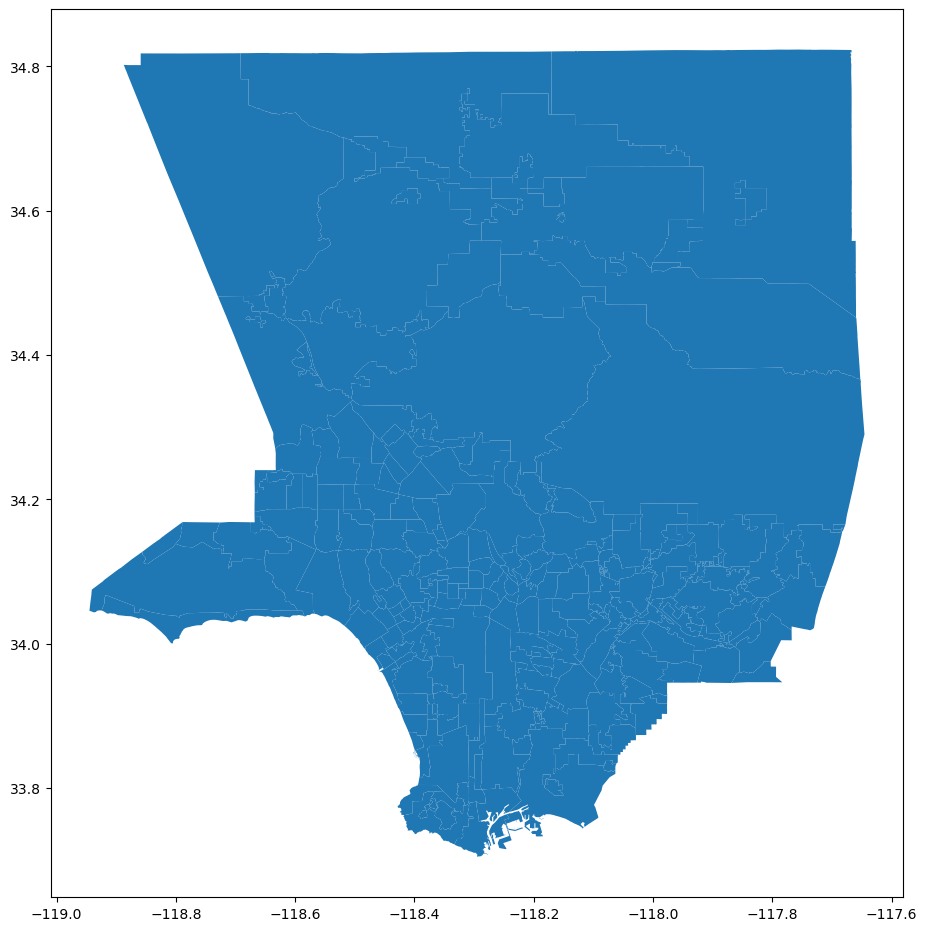

In [584]:
#Plot the new varaible with the unwanted land. Now LA Cojnty has been mapped
neighborhoods3.plot(figsize=(11,12))

In [585]:
#Import csv file with the % of commute time above 1 hour by neighborhood in LA County
commute=pd.read_csv('CTLC3.csv', delimiter=';')
commute.head()

,name,year,denom_tot_workers,Commute Time Above 1 Hour
0,Irwindale,2021,"804,94",15.25
1,Pico-Union,2021,"18793,13",16.64
2,Glendora,2021,"25208,2",17.26
3,Industry,2021,"6066,56",16.16
4,Sylmar,2021,"36939,14",11.57


In [586]:
#For the upcoming merge, we want to change the name of the variable "neighborhood" to allow the merge to work
commute.rename(columns={'name': 'Neighborhood'}, inplace=True)
commute.head()

,Neighborhood,year,denom_tot_workers,Commute Time Above 1 Hour
0,Irwindale,2021,"804,94",15.25
1,Pico-Union,2021,"18793,13",16.64
2,Glendora,2021,"25208,2",17.26
3,Industry,2021,"6066,56",16.16
4,Sylmar,2021,"36939,14",11.57


In [587]:
#Check bot databases have the same name of columnn
neighborhoods3.head()

,OBJECTID,spa,Neighborhood,sup_dist,geometry
0,1,SPA 1 - Antelope Valley,Acton,District 5,"MULTIPOLYGON Z (((-118.20262 34.53899 0.00000,..."
1,2,SPA 2 - San Fernando,Agoura Hills,District 3,"MULTIPOLYGON Z (((-118.76193 34.16820 0.00000,..."
2,3,SPA 1 - Antelope Valley,Agua Dulce,District 5,"MULTIPOLYGON Z (((-118.25468 34.55830 0.00000,..."
3,4,SPA 3 - San Gabriel,Alhambra,District 1,"MULTIPOLYGON Z (((-118.12175 34.10504 0.00000,..."
4,5,SPA 8 - South Bay,Alondra Park,District 2,"MULTIPOLYGON Z (((-118.32651 33.89757 0.00000,..."


In [588]:
#merge based on common element

merged_df = neighborhoods3.merge(commute,on='Neighborhood')



In [589]:
#Check the merge was succesfull
merged_df.head()

,OBJECTID,spa,Neighborhood,sup_dist,geometry,year,denom_tot_workers,Commute Time Above 1 Hour
0,1,SPA 1 - Antelope Valley,Acton,District 5,"MULTIPOLYGON Z (((-118.20262 34.53899 0.00000,...",2021,"1448,51",42.38
1,2,SPA 2 - San Fernando,Agoura Hills,District 3,"MULTIPOLYGON Z (((-118.76193 34.16820 0.00000,...",2021,"8032,5",15.27
2,3,SPA 1 - Antelope Valley,Agua Dulce,District 5,"MULTIPOLYGON Z (((-118.25468 34.55830 0.00000,...",2021,"2073,33",21.80
3,4,SPA 3 - San Gabriel,Alhambra,District 1,"MULTIPOLYGON Z (((-118.12175 34.10504 0.00000,...",2021,"40794,02",11.12
4,5,SPA 8 - South Bay,Alondra Park,District 2,"MULTIPOLYGON Z (((-118.32651 33.89757 0.00000,...",2021,"3869,87",16.85


In [590]:
#Check info
merged_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   OBJECTID                   225 non-null    int64   
 1   spa                        225 non-null    object  
 2   Neighborhood               225 non-null    object  
 3   sup_dist                   225 non-null    object  
 4   geometry                   225 non-null    geometry
 5   year                       225 non-null    int64   
 6   denom_tot_workers          224 non-null    object  
 7   Commute Time Above 1 Hour  224 non-null    float64 
dtypes: float64(1), geometry(1), int64(2), object(4)
memory usage: 14.2+ KB


In [591]:
merged_df.shape


(225, 8)

<Axes: >

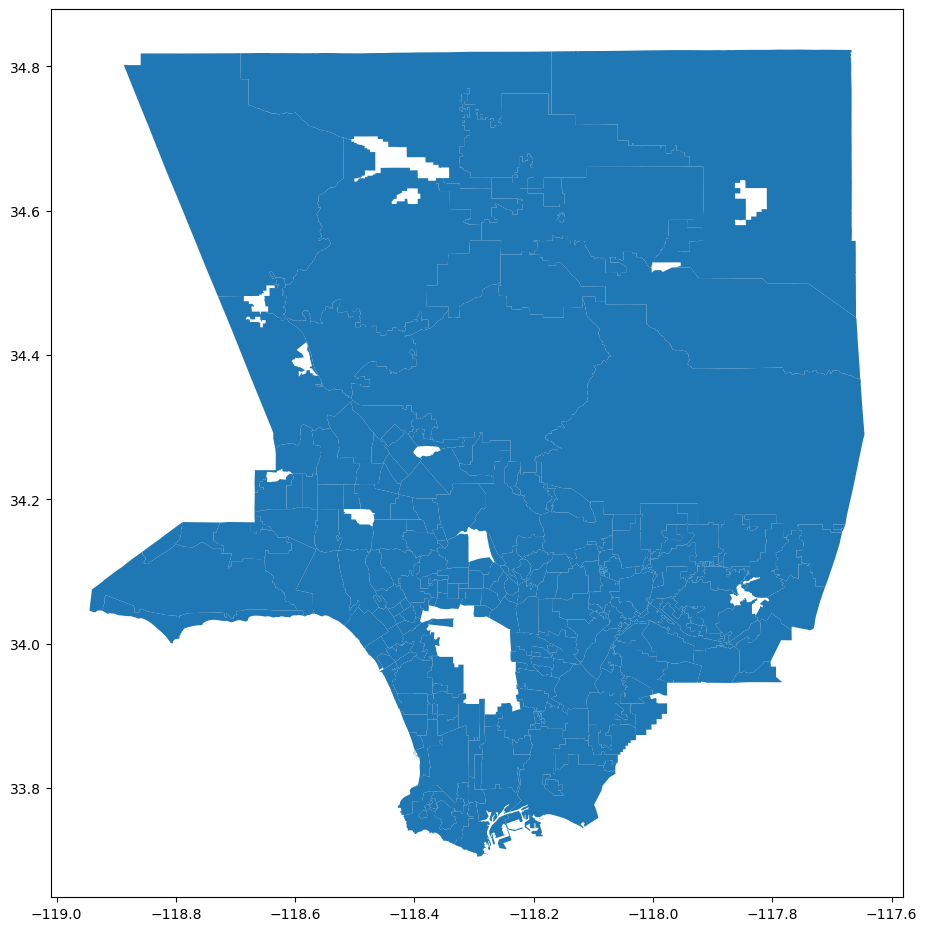

In [592]:
#Plot the merged database. Blank gaps in the map tells us the mssing neighborhoods in the previous databases
merged_df.plot(figsize=(11,12))

In [593]:
City_boundary=gpd.read_file('City_Boundary.geojson')

In [594]:
import geopandas as gpd

# Assuming merged_df and City_boundary are already defined and loaded as GeoDataFrames

# Clip the merged_df by the City_boundary
clipped_gdf = gpd.clip(merged_df, City_boundary)


<Axes: >

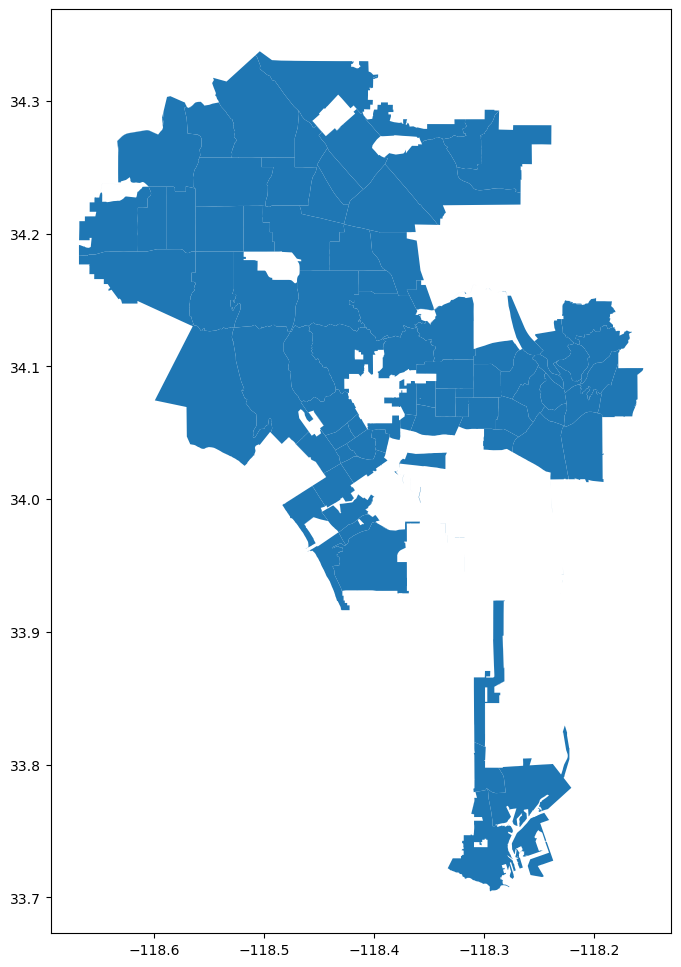

In [595]:
clipped_gdf.plot(figsize=(11,12))

In [596]:
# Check the size
clipped_gdf.shape

(121, 8)

In [597]:
# Check top
clipped_gdf.head()

,OBJECTID,spa,Neighborhood,sup_dist,geometry,year,denom_tot_workers,Commute Time Above 1 Hour
105,117,SPA 8 - South Bay,Long Beach,District 4,"MULTIPOLYGON Z (((-118.22111 33.78299 0.00000,...",2021,"226941,42",12.77
108,120,SPA 6 - South,Lynwood,District 4,"MULTIPOLYGON Z (((-118.23032 33.92900 0.00000,...",2021,"27420,91",13.02
176,190,SPA 7 - East,South Gate,District 4,"POLYGON Z ((-118.22802 33.94562 0.00000, -118....",2021,"41502,42",13.84
40,43,SPA 7 - East,Commerce,District 4,"POLYGON Z ((-118.19161 34.01508 0.00000, -118....",2021,"4936,4",11.17
209,226,SPA 8 - South Bay,West Compton,District 2,"POLYGON Z ((-118.28271 33.88547 0.00000, -118....",2021,"2853,16",7.78


<Axes: >

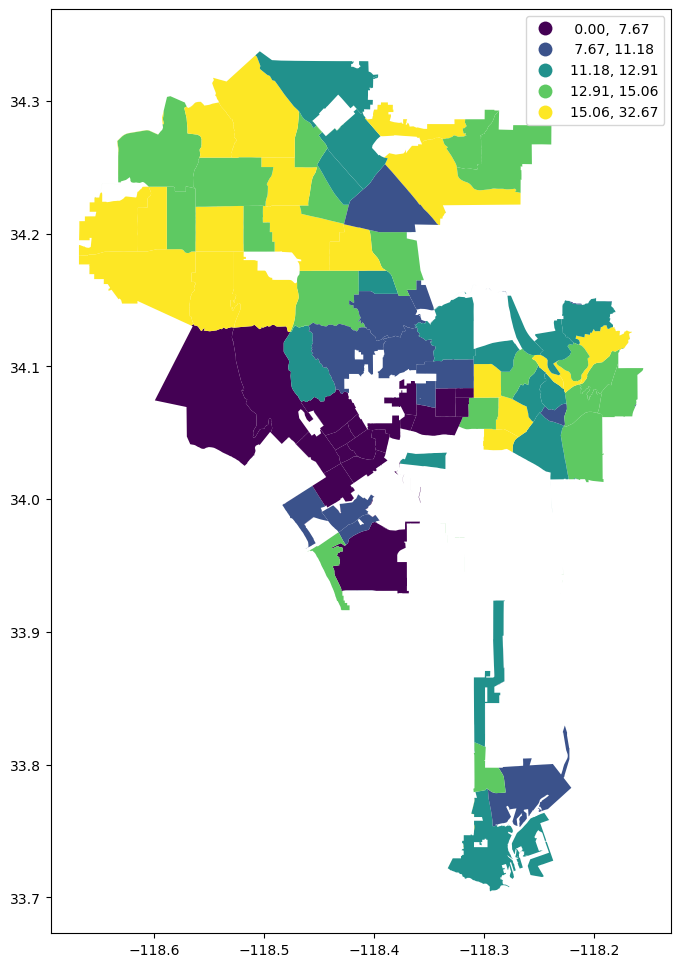

In [598]:
#Plot the new merged data, with quantiles as a firtst parameter. visualize the data
clipped_gdf.plot(figsize=(11,12),
               column='Commute Time Above 1 Hour',
               legend=True,
               scheme='quantiles')

In [599]:
LA_Commute=clipped_gdf

In [600]:
#Load income data for the multilayer map
LA_Income=gpd.read_file('MedianIncome.geojson')

In [601]:
LA_Commute.head()

,OBJECTID,spa,Neighborhood,sup_dist,geometry,year,denom_tot_workers,Commute Time Above 1 Hour
105,117,SPA 8 - South Bay,Long Beach,District 4,"MULTIPOLYGON Z (((-118.22111 33.78299 0.00000,...",2021,"226941,42",12.77
108,120,SPA 6 - South,Lynwood,District 4,"MULTIPOLYGON Z (((-118.23032 33.92900 0.00000,...",2021,"27420,91",13.02
176,190,SPA 7 - East,South Gate,District 4,"POLYGON Z ((-118.22802 33.94562 0.00000, -118....",2021,"41502,42",13.84
40,43,SPA 7 - East,Commerce,District 4,"POLYGON Z ((-118.19161 34.01508 0.00000, -118....",2021,"4936,4",11.17
209,226,SPA 8 - South Bay,West Compton,District 2,"POLYGON Z ((-118.28271 33.88547 0.00000, -118....",2021,"2853,16",7.78


In [602]:
LA_Commute.shape

(121, 8)

In [603]:
LA_Income.shape

(2495, 14)

In [604]:
import pandas as pd

In [605]:
import geopandas as gpd

In [606]:
import folium

In [607]:
print(LA_Commute['Commute Time Above 1 Hour'].dtype)
# If the column is not of a numeric type, convert it
LA_Commute['Commute Time Above 1 Hour'] = pd.to_numeric(LA_Commute['Commute Time Above 1 Hour'], errors='coerce')


float64


In [608]:
# Fill missing values with a default value, for example, 0
LA_Commute['Commute Time Above 1 Hour'].fillna(0, inplace=True)


In [609]:
LA_Commute_geojson = LA_Commute.to_json()

In [610]:
import folium

# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10, tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='RdBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Commute Time Above 1 Hour (%)'
).add_to(m)

# Display the map
m


In [611]:
# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10,tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='RdBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Commute Time Above 1 Hour (%)'
).add_to(m)

# Display the map
m

In [612]:
# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10,tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Commute Time Above 1 Hour (%)'
).add_to(m)

# Display the map
m

In [613]:
import pandas as pd

# Assuming 'Commute Time Above 1 Hour' is the column you're interested in
quantile_list = [0, .2, .4, .6, .8, 1.]
quantiles = LA_Commute['Commute Time Above 1 Hour'].quantile(quantile_list)

# Convert quantiles to a list to use as bins
bins = quantiles.tolist()


In [614]:
import folium

# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10,tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer using quantile bins
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=bins,  # Use the quantile bins here
).add_to(m)

# Display the map
m


In [615]:
pip install --upgrade jenkspy


Note: you may need to restart the kernel to use updated packages.


In [616]:
pip install --upgrade jenkspy

Note: you may need to restart the kernel to use updated packages.


In [617]:
import jenkspy

# Assuming LA_Commute['Commute Time Above 1 Hour'] is a valid Series with numerical data
values = LA_Commute['Commute Time Above 1 Hour'].dropna().values  # Ensure no NaN values and convert to numpy array

# Attempt to calculate natural breaks directly
breaks = jenkspy.jenks_breaks(values, 5)  # Here, '5' is the number of desired classes

print(breaks)


[0.0, 7.78, 12.13, 15.36, 20.46, 32.67]


In [618]:
import folium

# Natural breaks determined previously
breaks = [0.0, 7.78, 12.13, 15.36, 20.46, 32.67]

# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10,tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer using the natural breaks for classification
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',  # A color palette that reflects the data's distribution
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=breaks,  # Use the provided natural breaks here
).add_to(m)

# Display the map
m


In [619]:
import folium

# Assuming LA_Commute_geojson contains your GeoJSON data
# and LA_Commute is a DataFrame with 'Neighborhood' and 'Commute Time Above 1 Hour' data

# Natural breaks determined previously
breaks = [0.0, 7.78, 12.13, 15.36, 20.46, 32.67]

# Initialize a map centered on a rough average location of your data
m = folium.Map(location=[33.9, -118.2], zoom_start=10,tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer using the natural breaks for classification
# Adjust line_opacity for thinner borders
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='choropleth',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',  # A color palette that reflects the data's distribution
    fill_opacity=0.7,
    line_opacity=0.1,  # Make borders thinner
    legend_name='Commute Time Above 1 Hour (%)',
    bins=breaks,  # Use the provided natural breaks here
).add_to(m)

# Add GeoJson layer for neighborhood names
folium.GeoJson(
    LA_Commute_geojson,
    name='Neighborhood Names',
    style_function=lambda x: {'color': 'transparent', 'fillColor': 'transparent', 'weight': 0},
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood'],
        aliases=['Neighborhood:'],
        style=("background-color: white; color: #333333; font-family: Arial; font-size: 12px; padding: 10px; border-radius: 2px; border: 1px solid black;"),
        sticky=True
    )
).add_to(m)

# Ensure layer control is added to toggle different layers on the map
folium.LayerControl().add_to(m)

# Display the map
m


In [620]:
df = pd.read_excel('Median Household Income - 2022.xlsx')
# examine the shape of the data (# of rows and columns)
df.shape

(258, 4)

In [621]:
df = df[['name','Median Household Income']]
df.head(10)

,name,Median Household Income
0,Irwindale,100062.67
1,Pico-Union,46325.61
2,Glendora,111736.00
3,Industry,100091.73
4,Sylmar,91758.07
5,Torrance,111154.92
6,Alhambra,83391.57
7,Pico Rivera,81487.08
8,Rolling Hills Estates,186764.23
9,Signal Hill,92473.93


In [622]:
neighborhoods=gpd.read_file('LA_Neighborhoods.geojson')
neighborhoods.head(10)

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."
5,6,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1..."
6,7,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0..."
7,8,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0..."
8,9,Beverlywood,"POLYGON ((-118.38609 34.04675, -118.38934 34.0..."
9,10,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0..."


In [623]:
neighborhoods = neighborhoods[['name','geometry']]
# examine the first 10 rows of the data
neighborhoods.head(10)

,name,geometry
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."
5,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1..."
6,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0..."
7,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0..."
8,Beverlywood,"POLYGON ((-118.38609 34.04675, -118.38934 34.0..."
9,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0..."


In [624]:
neighborhoods_income=neighborhoods.merge(df,on="name")

In [625]:
neighborhoods_income.head(10)

,name,geometry,Median Household Income
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",47235.38
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",92989.90
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",50446.74
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",95033.06
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",65108.68
5,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1...",198222.17
6,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0...",210524.64
7,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0...",113333.95
8,Beverlywood,"POLYGON ((-118.38609 34.04675, -118.38934 34.0...",174437.77
9,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0...",55067.92


In [626]:
neighborhoods_income.shape

(110, 3)

In [627]:
neighborhoods_income.columns = ['Neighborhood',
'geometry',
'Median Household Income ($)']

In [628]:
# Convert to a projected CRS (e.g., UTM zone 11N for parts of California)
neighborhoods_income = neighborhoods_income.to_crs(epsg=32611)


In [629]:
neighborhoods_income['centroid'] = neighborhoods_income['geometry'].centroid


In [630]:
# Convert centroids back to WGS84 to get latitude and longitude
neighborhoods_income['centroid'] = neighborhoods_income['centroid'].to_crs(epsg=4326)

neighborhoods_income['Latitude'] = neighborhoods_income['centroid'].y
neighborhoods_income['Longitude'] = neighborhoods_income['centroid'].x


In [631]:
##import folium  THIS IS DEFINITE


# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Define a function to scale the median income to a suitable radius
def calculate_radius(income):
    # Example scaling: adjust the base radius based on your data's range and desired visual appearance
    base_radius = 10
    # Adjust this scaling factor as needed to fit your data and visual preferences
    return base_radius + (income / 10000)

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    # Use the latitude and longitude from the corrected centroid calculations
    lat = row['centroid'].y
    lon = row['centroid'].x
    # Calculate the radius based on median household income
    radius = calculate_radius(row['Median Household Income ($)'])
    
    # Add a circle to the map for each neighborhood
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Display the map
m


In [632]:
import folium
import numpy as np

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Update the calculate_radius function for dynamic scaling
def calculate_radius(income, min_income, max_income):
    # Normalize income to a value between 0 and 1
    normalized_income = (income - min_income) / (max_income - min_income)
    # Apply a non-linear transformation to emphasize differences
    # Adjust the multiplier for larger/smaller circles
    return 50 + (normalized_income ** 0.5) * 150

# First, determine the range of incomes to normalize circle sizes
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    # Extract latitude and longitude from the centroid
    lat = row['centroid'].y
    lon = row['centroid'].x
    # Dynamically calculate the radius based on median household income
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    
    # Add a circle to the map for each neighborhood
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Display the map
m


In [633]:
import folium

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Enhanced calculate_radius function for greater variation
def calculate_radius(income):
    # Apply a more aggressive scaling to emphasize differences
    # This uses a direct multiplier on the income, adjust as needed for visual clarity
    return income / 500  # Adjust this divisor to control the scaling

# Iterate through the GeoDataFrame to add circles with enhanced variation
for index, row in neighborhoods_income.iterrows():
    # Extract latitude and longitude from the centroid
    lat = row['centroid'].y
    lon = row['centroid'].x
    # Dynamically calculate the radius based on median household income with enhanced variation
    radius = calculate_radius(row['Median Household Income ($)'])
    
    # Add a circle to the map for each neighborhood
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Display the map
m



In [634]:
import folium

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Exponentially scale the radius based on income
def calculate_radius(income, min_income, max_income):
    # Normalize income between 0 and 1
    normalized_income = (income - min_income) / (max_income - min_income)
    # Apply exponential scaling for dramatic effect
    # Adjust the base of the exponent as needed for greater variation
    return 30 + (normalized_income ** 2) * 5000  # Increase the multiplier for greater effect

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles with exponential variation
for index, row in neighborhoods_income.iterrows():
    # Extract latitude and longitude from the centroid
    lat = row['centroid'].y
    lon = row['centroid'].x
    # Calculate the radius with exponential scaling
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    
    # Add a circle to the map for each neighborhood
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Display the map
m


In [635]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Define a function to scale the median income to a suitable radius
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 30 + (normalized_income ** 2) * 5000

# Define a function to determine circle color based on income
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'
    elif normalized_income < 0.4:
        return '#a1dab4'
    elif normalized_income < 0.6:
        return '#41b6c4'
    elif normalized_income < 0.8:
        return '#2c7fb8'
    else:
        return '#253494'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    lat = row['centroid'].y
    lon = row['centroid'].x
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    color = get_color(row['Median Household Income ($)'], min_income, max_income)
    
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 150px; height: 90px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            ">
&nbsp; Legend <br>
&nbsp; High Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#253494"></i><br>
&nbsp; Low Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#ffffcc"></i>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Display the map
m


In [636]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Updated calculate_radius function (if needed, based on previous context)
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 30 + (normalized_income ** 2) * 5000

# Updated get_color function for better visibility
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#fee5d9'
    elif normalized_income < 0.4:
        return '#fcae91'
    elif normalized_income < 0.6:
        return '#fb6a4a'
    elif normalized_income < 0.8:
        return '#de2d26'
    else:
        return '#a50f15'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    lat = row['centroid'].y
    lon = row['centroid'].x
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    color = get_color(row['Median Household Income ($)'], min_income, max_income)
    
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend (adjust as needed)
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 150px; height: 120px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            ">
&nbsp; Legend <br>
&nbsp; Highest Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#a50f15"></i><br>
&nbsp; High Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#de2d26"></i><br>
&nbsp; Medium Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#fb6a4a"></i><br>
&nbsp; Low Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#fcae91"></i><br>
&nbsp; Lowest Income &nbsp; <i class="fa fa-circle fa-1x" style="color:#fee5d9"></i>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Display the map
m


In [637]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Adjusted calculate_radius function for a more balanced representation
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000  # Adjusted scaling for circle sizes

# Adjusted get_color function with the previous color scheme and improved visibility for lowest incomes
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#fee0d2'  # Improved color for lowest incomes
    elif normalized_income < 0.4:
        return '#fc9272'
    elif normalized_income < 0.6:
        return '#fb6a4a'
    elif normalized_income < 0.8:
        return '#de2d26'
    else:
        return '#a50f15'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    lat = row['centroid'].y
    lon = row['centroid'].x
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    color = get_color(row['Median Household Income ($)'], min_income, max_income)
    
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend with Numeric Ranges
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height: 150px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            padding: 10px;">
&nbsp; Legend <br>
&nbsp; > $100,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#a50f15"></i><br>
&nbsp; $80,000 - $100,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#de2d26"></i><br>
&nbsp; $60,000 - $80,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#fb6a4a"></i><br>
&nbsp; $40,000 - $60,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#fc9272"></i><br>
&nbsp; < $40,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#fee0d2"></i>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Display the map
m


In [638]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron')

# Adjusted calculate_radius function for a more balanced representation
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000  # Adjusted scaling for circle sizes

# Adjusted get_color function for a blue-green-yellow color gradient
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'  # Yellow for lowest incomes
    elif normalized_income < 0.4:
        return '#c2e699'
    elif normalized_income < 0.6:
        return '#78c679'
    elif normalized_income < 0.8:
        return '#31a354'
    else:
        return '#006837'  # Dark green for highest incomes

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    lat = row['centroid'].y
    lon = row['centroid'].x
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    color = get_color(row['Median Household Income ($)'], min_income, max_income)
    
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend with Numeric Ranges and Updated Title
template = """
{% macro html(this, kwargs) %}
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 250px; height: 160px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            padding: 10px;">
&nbsp; <strong>Median Household Income ($)</strong> <br>
&nbsp; > $100,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#006837"></i><br>
&nbsp; $80,000 - $100,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#31a354"></i><br>
&nbsp; $60,000 - $80,000 &nbsp; <i class="fa fa-circle fa-1x"style="color:#78c679"></i><br>
&nbsp; $40,000 - $60,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#c2e699"></i><br>
&nbsp; < $40,000 &nbsp; <i class="fa fa-circle fa-1x" style="color:#ffffcc"></i>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Display the map
m


In [639]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron', attribution='CartoDB')

# Add the Choropleth layer for commute times
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='Commute Time',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.1,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=breaks,
).add_to(m)

# Add circles for median household income
# Define a function to scale the median income to a suitable radius
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000

# Define a function for the color gradient
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'
    elif normalized_income < 0.4:
        return '#c2e699'
    elif normalized_income < 0.6:
        return '#78c679'
    elif normalized_income < 0.8:
        return '#31a354'
    else:
        return '#006837'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Iterate through the GeoDataFrame to add circles
for index, row in neighborhoods_income.iterrows():
    lat = row['centroid'].y
    lon = row['centroid'].x
    radius = calculate_radius(row['Median Household Income ($)'], min_income, max_income)
    color = get_color(row['Median Household Income ($)'], min_income, max_income)
    
    folium.Circle(
        location=(lat, lon),
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Add layer control to toggle between layers
folium.LayerControl().add_to(m)

# Display the map
m


In [640]:
import os

# Print the current working directory
print(os.getcwd())

# Optionally, change the directory
# os.chdir('/path/to/directory')

# Then save the map
m.save('LA_Neighborhoods_Map.html')

/home/jovyan/week5


In [641]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron', attribution='CartoDB')

# Assuming LA_Commute_geojson and neighborhoods_income are already defined

# Add the Choropleth layer for commute times
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='Commute Time',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.1,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=[0.0, 7.78, 12.13, 15.36, 20.46, 32.67],
).add_to(m)

# Function to calculate circle radius
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000

# Function to determine circle color
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'
    elif normalized_income < 0.4:
        return '#c2e699'
    elif normalized_income < 0.6:
        return '#78c679'
    elif normalized_income < 0.8:
        return '#31a354'
    else:
        return '#006837'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Add circles for median household income
for index, row in neighborhoods_income.iterrows():
    folium.Circle(
        location=[row['centroid'].y, row['centroid'].x],
        radius=calculate_radius(row['Median Household Income ($)'], min_income, max_income),
        color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill=True,
        fill_color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend for Median Household Income
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 250px; height: 150px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            padding: 10px;">
    <strong>Median Household Income ($)</strong><br>
    > $100,000 &nbsp; <i style="background-color: #006837; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $80,000 - $100,000 &nbsp; <i style="background-color: #31a354; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $60,000 - $80,000 &nbsp; <i style="background-color: #78c679; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $40,000 - $60,000 &nbsp; <i style="background-color: #c2e699; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    < $40,000 &nbsp; <i style="background-color: #ffffcc; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i>
</div>
'''

legend = MacroElement()
legend._template = Template(legend_html)

m.get_root().add_child(legend)

# Add layer control to toggle between layers
folium.LayerControl().add_to(m)

# Display the map
m


In [642]:
import folium
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron', attribution='CartoDB')

# Assuming LA_Commute_geojson and neighborhoods_income are already defined

# Add the Choropleth layer for commute times
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='Commute Time',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=[0.0, 7.78, 12.13, 15.36, 20.46, 32.67],
).add_to(m)

# Function to calculate circle radius
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000

# Function to determine circle color
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'
    elif normalized_income < 0.4:
        return '#c2e699'
    elif normalized_income < 0.6:
        return '#78c679'
    elif normalized_income < 0.8:
        return '#31a354'
    else:
        return '#006837'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Add circles for median household income
for index, row in neighborhoods_income.iterrows():
    folium.Circle(
        location=[row['centroid'].y, row['centroid'].x],
        radius=calculate_radius(row['Median Household Income ($)'], min_income, max_income),
        color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill=True,
        fill_color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend for Median Household Income
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 250px; height: 150px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            padding: 10px;">
    <strong>Median Household Income ($)</strong><br>
    > $100,000 &nbsp; <i style="background-color: #006837; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $80,000 - $100,000 &nbsp; <i style="background-color: #31a354; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $60,000 - $80,000 &nbsp; <i style="background-color: #78c679; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $40,000 - $60,000 &nbsp; <i style="background-color: #c2e699; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    < $40,000 &nbsp; <i style="background-color: #ffffcc; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i>
</div>
'''

legend = MacroElement()
legend._template = Template(legend_html)

m.get_root().add_child(legend)

# Add layer control to toggle between layers
folium.LayerControl().add_to(m)

# Display the map
m



In [643]:
import folium
import numpy as np
from branca.element import Template, MacroElement

# Initialize a Folium map of the City of L.A.
m = folium.Map(location=[34.0549, -118.2426], zoom_start=10, tiles='CartoDB positron', attribution='CartoDB')

# Assuming LA_Commute_geojson and neighborhoods_income are already defined

# Add the Choropleth layer for commute times
folium.Choropleth(
    geo_data=LA_Commute_geojson,
    name='Commute Time',
    data=LA_Commute,
    columns=['Neighborhood', 'Commute Time Above 1 Hour'],
    key_on='feature.properties.Neighborhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.1,
    legend_name='Commute Time Above 1 Hour (%)',
    bins=[0.0, 7.78, 12.13, 15.36, 20.46, 32.67],
).add_to(m)

# Function to calculate circle radius
def calculate_radius(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    return 20 + (normalized_income ** 1.5) * 3000

# Function to determine circle color
def get_color(income, min_income, max_income):
    normalized_income = (income - min_income) / (max_income - min_income)
    if normalized_income < 0.2:
        return '#ffffcc'
    elif normalized_income < 0.4:
        return '#c2e699'
    elif normalized_income < 0.6:
        return '#78c679'
    elif normalized_income < 0.8:
        return '#31a354'
    else:
        return '#006837'

# Calculate min and max income for normalization
min_income = neighborhoods_income['Median Household Income ($)'].min()
max_income = neighborhoods_income['Median Household Income ($)'].max()

# Add circles for median household income
for index, row in neighborhoods_income.iterrows():
    folium.Circle(
        location=[row['centroid'].y, row['centroid'].x],
        radius=calculate_radius(row['Median Household Income ($)'], min_income, max_income),
        color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill=True,
        fill_color=get_color(row['Median Household Income ($)'], min_income, max_income),
        fill_opacity=0.7,
        tooltip=f"{row['Neighborhood']}: ${row['Median Household Income ($)']}"
    ).add_to(m)

# Custom Legend for Median Household Income
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 250px; height: 150px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;
            padding: 10px;">
    <strong>Median Household Income ($)</strong><br>
    > $100,000 &nbsp; <i style="background-color: #006837; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $80,000 - $100,000 &nbsp; <i style="background-color: #31a354; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $60,000 - $80,000 &nbsp; <i style="background-color: #78c679; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    $40,000 - $60,000 &nbsp; <i style="background-color: #c2e699; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i><br>
    < $40,000 &nbsp; <i style="background-color: #ffffcc; width: 12px; height: 12px; display: inline-block; opacity: 0.7;"></i>
</div>
'''

legend = MacroElement()
legend._template = Template(legend_html)

m.get_root().add_child(legend)

# Add layer control to toggle between layers
folium.LayerControl().add_to(m)

# Display the map
m


In [644]:
# Save the map as html
m.save("interactive_income_map.html")